**Swin UNETR, SCAFFOLD**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SwinUNETR
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints"
log_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

Checkpoints will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


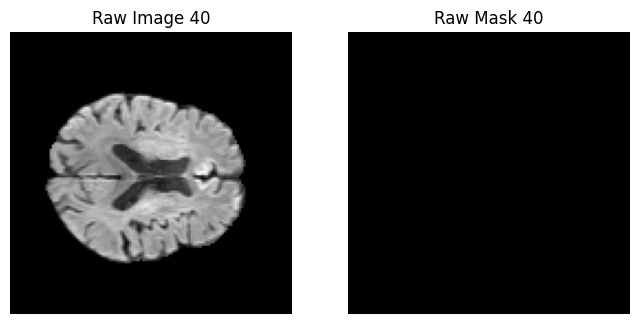

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


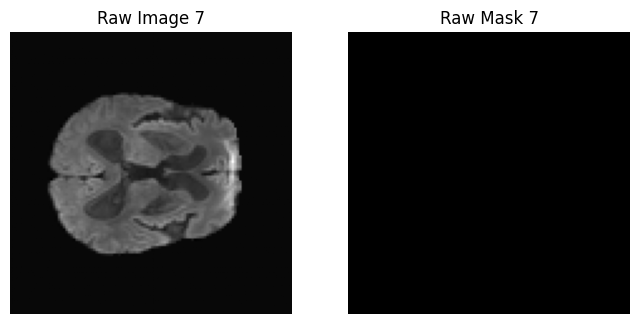

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


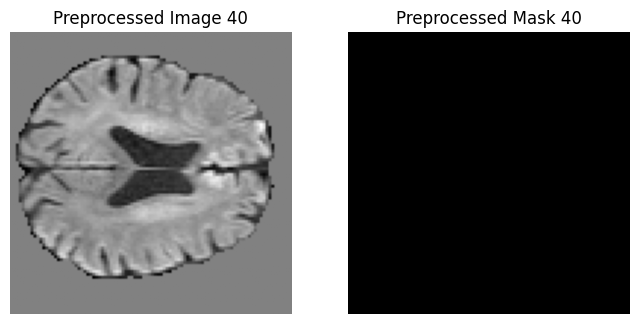

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


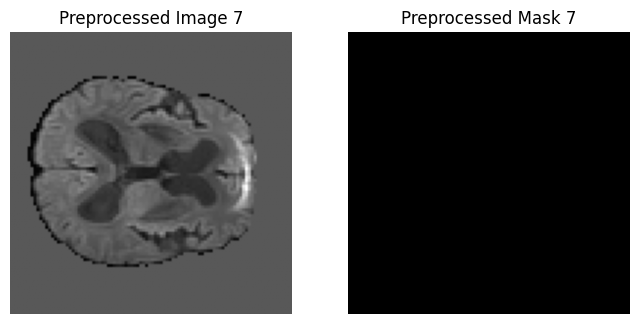

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


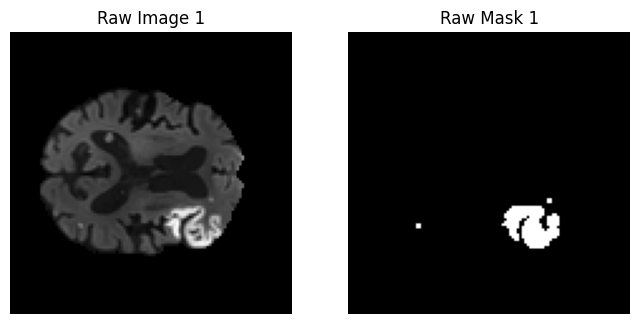

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


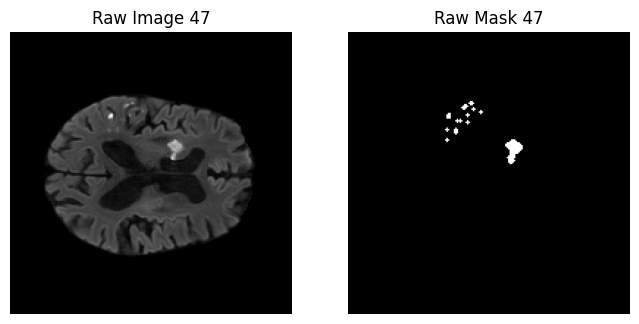

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


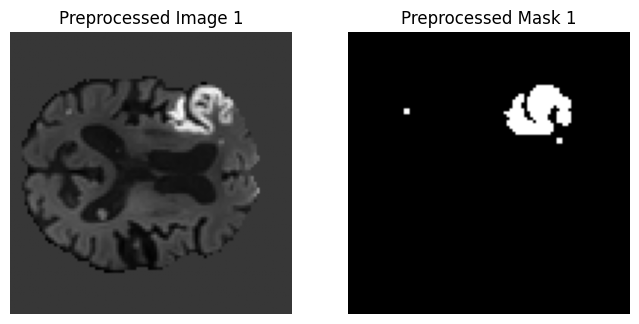

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


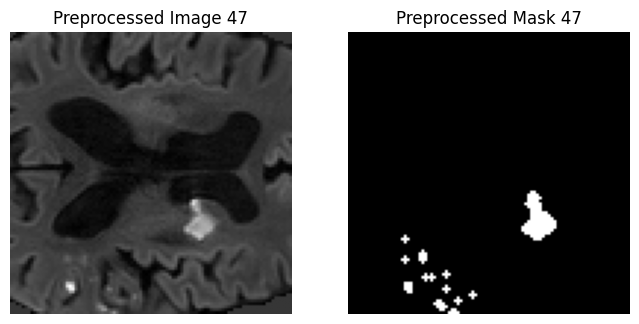

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


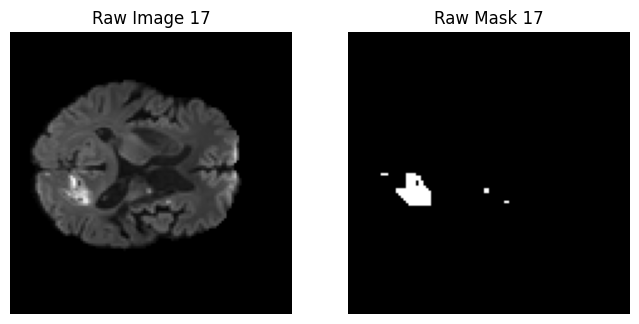

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


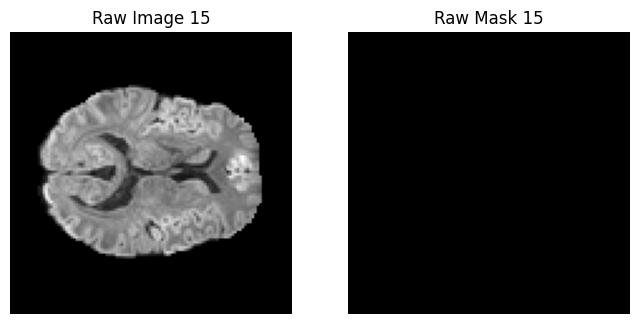

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


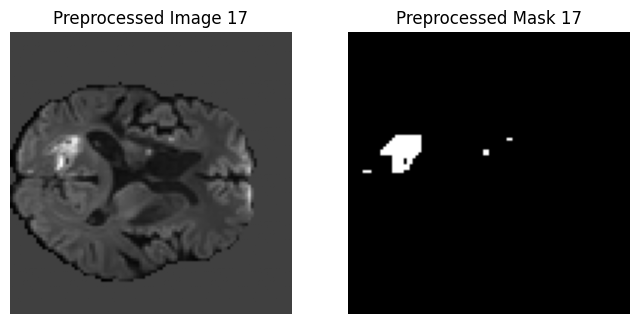

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


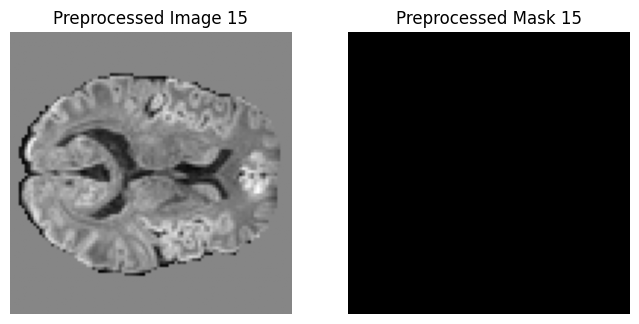

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin UNETR

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = SwinUNETR(
        in_channels=1,
        out_channels=1,
        feature_size=24,
        use_checkpoint=True
    ).to(device)

    print(model)
    return model

Using device: cuda


**Client Class**

In [14]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.SGD(self.model.parameters(), lr=1e-2, momentum=0) #SCAFFOLD uses SGD instead of Adam
        
        # --- SCAFFOLD CHANGE START ---
        # client control variate c_i
        self.c_i = {name: torch.zeros_like(param).to(device) 
                    for name, param in self.model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)
        
    # --- SCAFFOLD CHANGE START ---
    # server also sends control variate c
    def set_server_control(self, c):
        self.c = {k: v.clone().to(self.device) for k, v in c.items()}
    # --- SCAFFOLD CHANGE END ---


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # --- SCAFFOLD CHANGE START ---
        # store initial parameters to compute update later
        global_params = {name: param.clone().detach()
                         for name, param in self.model.named_parameters()}
        # count local steps
        local_steps = 0
        # --- SCAFFOLD CHANGE END ---

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                
                # --- SCAFFOLD CHANGE START ---
                # modify gradients using control variates
                for name, param in self.model.named_parameters():
                    if param.grad is not None:
                        param.grad -= self.c_i[name]
                        param.grad += self.c[name]
                # --- SCAFFOLD CHANGE END ---
                
                self.optimizer.step()
                local_steps += 1

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)
        
        # --- SCAFFOLD CHANGE START ---
        # update client control variate
        new_c_i = {}
        delta_c_i = {}

        lr = self.optimizer.param_groups[0]["lr"] 
        for name, param in self.model.named_parameters():
            # diff = (initial_params - final_params)
            diff = global_params[name] - param.detach()
            
            # K is local_steps (total batches processed)
            # new_c_i_plus = c_i - c + (diff / (K * lr))
            new_c_i_plus = self.c_i[name] - self.c[name] + (diff / (local_steps * lr))

            delta_c_i[name] = new_c_i_plus - self.c_i[name]
            new_c_i[name] = new_c_i_plus

        # update client control
        self.c_i = new_c_i
        print("mean |c_i|:", torch.mean(
            torch.stack([v.abs().mean() for v in self.c_i.values()])
        ))
        print("max |c_i|:", max(v.abs().max().item() for v in self.c_i.values()))
        # --- SCAFFOLD CHANGE END ---

        # Return last epoch metrics 
        return avg_loss, mean_dice, mean_iou, mean_hd95, delta_c_i

**Server Class**

In [15]:
class Server:
    def __init__(self, val_loader, device, server_lr=1):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        self.server_lr=server_lr #ng
        
        # --- SCAFFOLD CHANGE START ---
        # server control variate
        self.c = {name: torch.zeros_like(param).to(device)
            for name, param in self.global_model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    
    def aggregate(self, client_params_list, delta_c_list):

        global_params = self.global_model.state_dict()
        new_params = {}
        
        # find delta (new clients - old global)
        for key in global_params.keys():

            # if not a learnable parameter (not a float tensor), skip it
            if not torch.is_floating_point(global_params[key]):
                new_params[key] = global_params[key]
                continue

            delta = torch.zeros_like(global_params[key])

            for client in client_params_list:
                delta += client[key].to(self.device) - global_params[key]

            delta /= len(client_params_list)  # |S|

            new_params[key] = global_params[key] + self.server_lr * delta

        self.global_model.load_state_dict(new_params)

        # ---- Control variate update ----
        for name in self.c.keys():

            update = torch.zeros_like(self.c[name])

            for delta_c in delta_c_list:
                update += delta_c[name].to(self.device)

            update /= num_clients   # 1/N

            self.c[name] += update

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)
            
            # --- SCAFFOLD CHANGE START ---
            # send server control variate to clients
            client.set_server_control(self.c)
            # --- SCAFFOLD CHANGE END ---

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [16]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Linear(in_features=

**Federated Training loop**

In [17]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []
    delta_c_list = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95, delta_c_i = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())
        delta_c_list.append(delta_c_i)

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params, delta_c_list)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8747 | Dice: 0.0292 | IoU: 0.0148 | HD95: 50.6461


Client 0 | Epoch 2/20 | Loss: 0.8221 | Dice: 0.0751 | IoU: 0.0390 | HD95: 41.5916


Client 0 | Epoch 3/20 | Loss: 0.7945 | Dice: 0.1185 | IoU: 0.0630 | HD95: 39.5699


Client 0 | Epoch 4/20 | Loss: 0.7745 | Dice: 0.1511 | IoU: 0.0817 | HD95: 38.1488


Client 0 | Epoch 5/20 | Loss: 0.7581 | Dice: 0.1776 | IoU: 0.0975 | HD95: 37.3105


Client 0 | Epoch 6/20 | Loss: 0.7440 | Dice: 0.2018 | IoU: 0.1122 | HD95: 36.8550


Client 0 | Epoch 7/20 | Loss: 0.7323 | Dice: 0.1963 | IoU: 0.1089 | HD95: 36.9511


Client 0 | Epoch 8/20 | Loss: 0.7210 | Dice: 0.2074 | IoU: 0.1157 | HD95: 36.9628


Client 0 | Epoch 9/20 | Loss: 0.7116 | Dice: 0.2154 | IoU: 0.1207 | HD95: 36.9113


Client 0 | Epoch 10/20 | Loss: 0.7047 | Dice: 0.2149 | IoU: 0.1204 | HD95: 36.6914


Client 0 | Epoch 11/20 | Loss: 0.6953 | Dice: 0.2149 | IoU: 0.1204 | HD95: 36.8156


Client 0 | Epoch 12/20 | Loss: 0.6889 | Dice: 0.2241 | IoU: 0.1262 | HD95: 37.2063


Client 0 | Epoch 13/20 | Loss: 0.6798 | Dice: 0.2400 | IoU: 0.1363 | HD95: 37.0380


Client 0 | Epoch 14/20 | Loss: 0.6728 | Dice: 0.2304 | IoU: 0.1302 | HD95: 36.8423


Client 0 | Epoch 15/20 | Loss: 0.6680 | Dice: 0.2217 | IoU: 0.1247 | HD95: 36.7110


Client 0 | Epoch 16/20 | Loss: 0.6599 | Dice: 0.2285 | IoU: 0.1290 | HD95: 37.1613


Client 0 | Epoch 17/20 | Loss: 0.6501 | Dice: 0.2559 | IoU: 0.1467 | HD95: 36.9729


Client 0 | Epoch 18/20 | Loss: 0.6488 | Dice: 0.2315 | IoU: 0.1309 | HD95: 37.4617


Client 0 | Epoch 19/20 | Loss: 0.6368 | Dice: 0.2523 | IoU: 0.1444 | HD95: 36.5655


Clients Training:  33%|███▎      | 1/3 [06:53<13:46, 413.10s/it]

Client 0 | Epoch 20/20 | Loss: 0.6330 | Dice: 0.2360 | IoU: 0.1338 | HD95: 36.5392
mean |c_i|: tensor(0.0005, device='cuda:0')
max |c_i|: 0.05618496611714363
Client 0 | Loss=0.7135 | Dice=0.2360 | IoU=0.1338 | HD95=36.5392


Client 1 | Epoch 1/20 | Loss: 0.8738 | Dice: 0.0281 | IoU: 0.0143 | HD95: 47.1712


Client 1 | Epoch 2/20 | Loss: 0.8210 | Dice: 0.0703 | IoU: 0.0364 | HD95: 37.9412


Client 1 | Epoch 3/20 | Loss: 0.7933 | Dice: 0.1159 | IoU: 0.0615 | HD95: 35.8752


Client 1 | Epoch 4/20 | Loss: 0.7730 | Dice: 0.1545 | IoU: 0.0837 | HD95: 34.5494


Client 1 | Epoch 5/20 | Loss: 0.7564 | Dice: 0.1728 | IoU: 0.0946 | HD95: 34.1571


Client 1 | Epoch 6/20 | Loss: 0.7422 | Dice: 0.2049 | IoU: 0.1141 | HD95: 33.9384


Client 1 | Epoch 7/20 | Loss: 0.7303 | Dice: 0.2063 | IoU: 0.1150 | HD95: 34.2513


Client 1 | Epoch 8/20 | Loss: 0.7207 | Dice: 0.2090 | IoU: 0.1167 | HD95: 34.2436


Client 1 | Epoch 9/20 | Loss: 0.7101 | Dice: 0.2341 | IoU: 0.1326 | HD95: 34.3612


Client 1 | Epoch 10/20 | Loss: 0.7027 | Dice: 0.2240 | IoU: 0.1261 | HD95: 34.2228


Client 1 | Epoch 11/20 | Loss: 0.6932 | Dice: 0.2532 | IoU: 0.1450 | HD95: 34.5699


Client 1 | Epoch 12/20 | Loss: 0.6861 | Dice: 0.2425 | IoU: 0.1380 | HD95: 34.4527


Client 1 | Epoch 13/20 | Loss: 0.6785 | Dice: 0.2513 | IoU: 0.1437 | HD95: 34.4977


Client 1 | Epoch 14/20 | Loss: 0.6721 | Dice: 0.2362 | IoU: 0.1339 | HD95: 34.5435


Client 1 | Epoch 15/20 | Loss: 0.6640 | Dice: 0.2552 | IoU: 0.1462 | HD95: 34.6060


Client 1 | Epoch 16/20 | Loss: 0.6553 | Dice: 0.2547 | IoU: 0.1459 | HD95: 34.8141


Client 1 | Epoch 17/20 | Loss: 0.6459 | Dice: 0.2911 | IoU: 0.1703 | HD95: 34.2628


Client 1 | Epoch 18/20 | Loss: 0.6392 | Dice: 0.2791 | IoU: 0.1622 | HD95: 34.5237


Client 1 | Epoch 19/20 | Loss: 0.6284 | Dice: 0.2963 | IoU: 0.1739 | HD95: 34.5676


Clients Training:  67%|██████▋   | 2/3 [13:50<06:55, 415.83s/it]

Client 1 | Epoch 20/20 | Loss: 0.6205 | Dice: 0.2953 | IoU: 0.1732 | HD95: 34.5470
mean |c_i|: tensor(0.0005, device='cuda:0')
max |c_i|: 0.05659622699022293
Client 1 | Loss=0.7103 | Dice=0.2953 | IoU=0.1732 | HD95=34.5470


Client 2 | Epoch 1/20 | Loss: 0.8727 | Dice: 0.0434 | IoU: 0.0222 | HD95: 49.6271


Client 2 | Epoch 2/20 | Loss: 0.8195 | Dice: 0.1035 | IoU: 0.0546 | HD95: 40.4170


Client 2 | Epoch 3/20 | Loss: 0.7910 | Dice: 0.1502 | IoU: 0.0812 | HD95: 38.6640


Client 2 | Epoch 4/20 | Loss: 0.7695 | Dice: 0.2014 | IoU: 0.1120 | HD95: 37.1624


Client 2 | Epoch 5/20 | Loss: 0.7511 | Dice: 0.2214 | IoU: 0.1245 | HD95: 37.1001


Client 2 | Epoch 6/20 | Loss: 0.7362 | Dice: 0.2421 | IoU: 0.1377 | HD95: 36.8272


Client 2 | Epoch 7/20 | Loss: 0.7221 | Dice: 0.2598 | IoU: 0.1493 | HD95: 36.3648


Client 2 | Epoch 8/20 | Loss: 0.7096 | Dice: 0.2664 | IoU: 0.1537 | HD95: 36.9536


Client 2 | Epoch 9/20 | Loss: 0.7001 | Dice: 0.2650 | IoU: 0.1527 | HD95: 37.0744


Client 2 | Epoch 10/20 | Loss: 0.6893 | Dice: 0.2674 | IoU: 0.1543 | HD95: 36.8288


Client 2 | Epoch 11/20 | Loss: 0.6784 | Dice: 0.2760 | IoU: 0.1601 | HD95: 37.1802


Client 2 | Epoch 12/20 | Loss: 0.6669 | Dice: 0.3004 | IoU: 0.1767 | HD95: 36.9335


Client 2 | Epoch 13/20 | Loss: 0.6579 | Dice: 0.3083 | IoU: 0.1822 | HD95: 37.0070


Client 2 | Epoch 14/20 | Loss: 0.6482 | Dice: 0.3057 | IoU: 0.1805 | HD95: 36.9459


Client 2 | Epoch 15/20 | Loss: 0.6366 | Dice: 0.3306 | IoU: 0.1981 | HD95: 36.7716


Client 2 | Epoch 16/20 | Loss: 0.6229 | Dice: 0.3453 | IoU: 0.2087 | HD95: 36.7438


Client 2 | Epoch 17/20 | Loss: 0.6143 | Dice: 0.3167 | IoU: 0.1882 | HD95: 36.3713


Client 2 | Epoch 18/20 | Loss: 0.6065 | Dice: 0.3299 | IoU: 0.1976 | HD95: 35.8382


Client 2 | Epoch 19/20 | Loss: 0.5951 | Dice: 0.3317 | IoU: 0.1988 | HD95: 36.5906


Client 2 Epochs: 100%|██████████| 20/20 [06:55<00:00, 20.78s/it]

Client 2 | Epoch 20/20 | Loss: 0.5839 | Dice: 0.3343 | IoU: 0.2007 | HD95: 35.8190
mean |c_i|: tensor(0.0006, device='cuda:0')
max |c_i|: 0.06192755699157715


Client 2 | Loss=0.6936 | Dice=0.3343 | IoU=0.2007 | HD95=35.8190
Best global model updated with Dice=0.1739
Global | Val Loss=0.6555 | Dice=0.1739 | IoU=0.0952 | HD95=41.2481
Checkpoint saved for round 1 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6170 | Dice: 0.2661 | IoU: 0.1535 | HD95: 36.4328


Client 0 | Epoch 2/20 | Loss: 0.6116 | Dice: 0.2729 | IoU: 0.1580 | HD95: 36.6298


Client 0 | Epoch 3/20 | Loss: 0.6018 | Dice: 0.2885 | IoU: 0.1686 | HD95: 36.5315


Client 0 | Epoch 4/20 | Loss: 0.5912 | Dice: 0.3141 | IoU: 0.1863 | HD95: 36.2411


Client 0 | Epoch 5/20 | Loss: 0.5890 | Dice: 0.3194 | IoU: 0.1900 | HD95: 35.6819


Client 0 | Epoch 6/20 | Loss: 0.5778 | Dice: 0.3063 | IoU: 0.1808 | HD95: 36.0345


Client 0 | Epoch 7/20 | Loss: 0.5738 | Dice: 0.3168 | IoU: 0.1882 | HD95: 36.0747


Client 0 | Epoch 8/20 | Loss: 0.5571 | Dice: 0.3421 | IoU: 0.2064 | HD95: 35.5286


Client 0 | Epoch 9/20 | Loss: 0.5570 | Dice: 0.3397 | IoU: 0.2046 | HD95: 34.5423


Client 0 | Epoch 10/20 | Loss: 0.5523 | Dice: 0.3408 | IoU: 0.2054 | HD95: 34.7763


Client 0 | Epoch 11/20 | Loss: 0.5335 | Dice: 0.3771 | IoU: 0.2323 | HD95: 32.9707


Client 0 | Epoch 12/20 | Loss: 0.5328 | Dice: 0.3694 | IoU: 0.2265 | HD95: 33.2772


Client 0 | Epoch 13/20 | Loss: 0.5138 | Dice: 0.3967 | IoU: 0.2475 | HD95: 32.6871


Client 0 | Epoch 14/20 | Loss: 0.5029 | Dice: 0.4008 | IoU: 0.2507 | HD95: 31.8518


Client 0 | Epoch 15/20 | Loss: 0.5015 | Dice: 0.4061 | IoU: 0.2548 | HD95: 31.4983


Client 0 | Epoch 16/20 | Loss: 0.4862 | Dice: 0.4357 | IoU: 0.2785 | HD95: 31.5877


Client 0 | Epoch 17/20 | Loss: 0.4850 | Dice: 0.4125 | IoU: 0.2599 | HD95: 29.5507


Client 0 | Epoch 18/20 | Loss: 0.4596 | Dice: 0.4727 | IoU: 0.3095 | HD95: 30.0464


Client 0 | Epoch 19/20 | Loss: 0.4460 | Dice: 0.4735 | IoU: 0.3102 | HD95: 28.4820


Clients Training:  33%|███▎      | 1/3 [06:48<13:37, 408.53s/it]

Client 0 | Epoch 20/20 | Loss: 0.4558 | Dice: 0.4568 | IoU: 0.2960 | HD95: 27.2109
mean |c_i|: tensor(0.0004, device='cuda:0')
max |c_i|: 0.03634842112660408
Client 0 | Loss=0.5373 | Dice=0.4568 | IoU=0.2960 | HD95=27.2109


Client 1 | Epoch 1/20 | Loss: 0.6059 | Dice: 0.3008 | IoU: 0.1770 | HD95: 33.9777


Client 1 | Epoch 2/20 | Loss: 0.5969 | Dice: 0.3274 | IoU: 0.1957 | HD95: 34.2168


Client 1 | Epoch 3/20 | Loss: 0.5875 | Dice: 0.3159 | IoU: 0.1876 | HD95: 33.9203


Client 1 | Epoch 4/20 | Loss: 0.5776 | Dice: 0.3394 | IoU: 0.2044 | HD95: 33.9187


Client 1 | Epoch 5/20 | Loss: 0.5716 | Dice: 0.3228 | IoU: 0.1925 | HD95: 33.8127


Client 1 | Epoch 6/20 | Loss: 0.5569 | Dice: 0.3485 | IoU: 0.2110 | HD95: 33.4215


Client 1 | Epoch 7/20 | Loss: 0.5491 | Dice: 0.3570 | IoU: 0.2173 | HD95: 33.3943


Client 1 | Epoch 8/20 | Loss: 0.5397 | Dice: 0.3747 | IoU: 0.2306 | HD95: 33.2242


Client 1 | Epoch 9/20 | Loss: 0.5348 | Dice: 0.3570 | IoU: 0.2173 | HD95: 33.2271


Client 1 | Epoch 10/20 | Loss: 0.5192 | Dice: 0.3986 | IoU: 0.2489 | HD95: 32.7053


Client 1 | Epoch 11/20 | Loss: 0.5125 | Dice: 0.3951 | IoU: 0.2462 | HD95: 32.1427


Client 1 | Epoch 12/20 | Loss: 0.5095 | Dice: 0.3903 | IoU: 0.2424 | HD95: 32.0703


Client 1 | Epoch 13/20 | Loss: 0.4968 | Dice: 0.4050 | IoU: 0.2539 | HD95: 32.5656


Client 1 | Epoch 14/20 | Loss: 0.4881 | Dice: 0.4152 | IoU: 0.2620 | HD95: 30.7308


Client 1 | Epoch 15/20 | Loss: 0.4680 | Dice: 0.4414 | IoU: 0.2832 | HD95: 29.8543


Client 1 | Epoch 16/20 | Loss: 0.4670 | Dice: 0.4520 | IoU: 0.2920 | HD95: 29.6490


Client 1 | Epoch 17/20 | Loss: 0.4509 | Dice: 0.4702 | IoU: 0.3074 | HD95: 28.6432


Client 1 | Epoch 18/20 | Loss: 0.4317 | Dice: 0.5072 | IoU: 0.3398 | HD95: 27.3740


Client 1 | Epoch 19/20 | Loss: 0.4260 | Dice: 0.5091 | IoU: 0.3415 | HD95: 27.2996


Clients Training:  67%|██████▋   | 2/3 [13:40<06:50, 410.27s/it]

Client 1 | Epoch 20/20 | Loss: 0.4091 | Dice: 0.5283 | IoU: 0.3590 | HD95: 24.5594
mean |c_i|: tensor(0.0004, device='cuda:0')
max |c_i|: 0.039265669882297516
Client 1 | Loss=0.5149 | Dice=0.5283 | IoU=0.3590 | HD95=24.5594


Client 2 | Epoch 1/20 | Loss: 0.5849 | Dice: 0.3476 | IoU: 0.2104 | HD95: 35.7821


Client 2 | Epoch 2/20 | Loss: 0.5799 | Dice: 0.3461 | IoU: 0.2093 | HD95: 35.2676


Client 2 | Epoch 3/20 | Loss: 0.5666 | Dice: 0.3426 | IoU: 0.2067 | HD95: 35.7828


Client 2 | Epoch 4/20 | Loss: 0.5548 | Dice: 0.3628 | IoU: 0.2216 | HD95: 35.1855


Client 2 | Epoch 5/20 | Loss: 0.5439 | Dice: 0.3917 | IoU: 0.2435 | HD95: 33.9557


Client 2 | Epoch 6/20 | Loss: 0.5444 | Dice: 0.3424 | IoU: 0.2066 | HD95: 35.6226


Client 2 | Epoch 7/20 | Loss: 0.5309 | Dice: 0.3733 | IoU: 0.2295 | HD95: 34.0315


Client 2 | Epoch 8/20 | Loss: 0.5043 | Dice: 0.4293 | IoU: 0.2734 | HD95: 33.6826


Client 2 | Epoch 9/20 | Loss: 0.4963 | Dice: 0.4309 | IoU: 0.2746 | HD95: 33.0009


Client 2 | Epoch 10/20 | Loss: 0.4911 | Dice: 0.4254 | IoU: 0.2701 | HD95: 32.4855


Client 2 | Epoch 11/20 | Loss: 0.4837 | Dice: 0.4453 | IoU: 0.2864 | HD95: 32.6374


Client 2 | Epoch 12/20 | Loss: 0.4717 | Dice: 0.4521 | IoU: 0.2921 | HD95: 32.2551


Client 2 | Epoch 13/20 | Loss: 0.4638 | Dice: 0.4479 | IoU: 0.2886 | HD95: 31.8158


Client 2 | Epoch 14/20 | Loss: 0.4519 | Dice: 0.4601 | IoU: 0.2988 | HD95: 31.9633


Client 2 | Epoch 15/20 | Loss: 0.4397 | Dice: 0.4835 | IoU: 0.3188 | HD95: 30.9538


Client 2 | Epoch 16/20 | Loss: 0.4475 | Dice: 0.4657 | IoU: 0.3035 | HD95: 30.6099


Client 2 | Epoch 17/20 | Loss: 0.4278 | Dice: 0.4863 | IoU: 0.3213 | HD95: 29.9251


Client 2 | Epoch 18/20 | Loss: 0.4130 | Dice: 0.5014 | IoU: 0.3346 | HD95: 27.9682


Client 2 | Epoch 19/20 | Loss: 0.3945 | Dice: 0.5373 | IoU: 0.3673 | HD95: 27.1143


Client 2 Epochs: 100%|██████████| 20/20 [06:51<00:00, 20.56s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3893 | Dice: 0.5386 | IoU: 0.3685 | HD95: 25.4513
mean |c_i|: tensor(0.0004, device='cuda:0')
max |c_i|: 0.04094459488987923
Client 2 | Loss=0.4890 | Dice=0.5386 | IoU=0.3685 | HD95=25.4513


Best global model updated with Dice=0.4739
Global | Val Loss=0.4475 | Dice=0.4739 | IoU=0.3105 | HD95=30.2760
Checkpoint saved for round 2 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4402 | Dice: 0.4731 | IoU: 0.3098 | HD95: 27.1931


Client 0 | Epoch 2/20 | Loss: 0.4288 | Dice: 0.4912 | IoU: 0.3256 | HD95: 25.5834


Client 0 | Epoch 3/20 | Loss: 0.4178 | Dice: 0.5160 | IoU: 0.3477 | HD95: 24.0472


Client 0 | Epoch 4/20 | Loss: 0.4072 | Dice: 0.5180 | IoU: 0.3496 | HD95: 22.5289


Client 0 | Epoch 5/20 | Loss: 0.3779 | Dice: 0.5800 | IoU: 0.4085 | HD95: 20.1331


Client 0 | Epoch 6/20 | Loss: 0.3577 | Dice: 0.6093 | IoU: 0.4381 | HD95: 18.1703


Client 0 | Epoch 7/20 | Loss: 0.3540 | Dice: 0.5995 | IoU: 0.4281 | HD95: 18.9673


Client 0 | Epoch 8/20 | Loss: 0.3278 | Dice: 0.6368 | IoU: 0.4671 | HD95: 16.4172


Client 0 | Epoch 9/20 | Loss: 0.3111 | Dice: 0.6639 | IoU: 0.4969 | HD95: 15.2043


Client 0 | Epoch 10/20 | Loss: 0.3263 | Dice: 0.6274 | IoU: 0.4571 | HD95: 16.3754


Client 0 | Epoch 11/20 | Loss: 0.2849 | Dice: 0.6890 | IoU: 0.5255 | HD95: 12.4405


Client 0 | Epoch 12/20 | Loss: 0.2864 | Dice: 0.6721 | IoU: 0.5062 | HD95: 13.1582


Client 0 | Epoch 13/20 | Loss: 0.2538 | Dice: 0.7248 | IoU: 0.5683 | HD95: 10.0793


Client 0 | Epoch 14/20 | Loss: 0.2411 | Dice: 0.7376 | IoU: 0.5843 | HD95: 10.8481


Client 0 | Epoch 15/20 | Loss: 0.2407 | Dice: 0.7316 | IoU: 0.5768 | HD95: 10.4907


Client 0 | Epoch 16/20 | Loss: 0.2229 | Dice: 0.7512 | IoU: 0.6015 | HD95: 7.4308


Client 0 | Epoch 17/20 | Loss: 0.2239 | Dice: 0.7460 | IoU: 0.5949 | HD95: 9.1959


Client 0 | Epoch 18/20 | Loss: 0.2095 | Dice: 0.7688 | IoU: 0.6244 | HD95: 7.3660


Client 0 | Epoch 19/20 | Loss: 0.1928 | Dice: 0.7849 | IoU: 0.6460 | HD95: 6.3382


Clients Training:  33%|███▎      | 1/3 [06:40<13:21, 400.57s/it]

Client 0 | Epoch 20/20 | Loss: 0.1888 | Dice: 0.7923 | IoU: 0.6560 | HD95: 5.7635
mean |c_i|: tensor(0.0003, device='cuda:0')
max |c_i|: 0.027030883356928825
Client 0 | Loss=0.3047 | Dice=0.7923 | IoU=0.6560 | HD95=5.7635


Client 1 | Epoch 1/20 | Loss: 0.4277 | Dice: 0.4838 | IoU: 0.3191 | HD95: 27.5803


Client 1 | Epoch 2/20 | Loss: 0.4109 | Dice: 0.5114 | IoU: 0.3435 | HD95: 26.1240


Client 1 | Epoch 3/20 | Loss: 0.3861 | Dice: 0.5513 | IoU: 0.3806 | HD95: 23.6078


Client 1 | Epoch 4/20 | Loss: 0.3801 | Dice: 0.5543 | IoU: 0.3834 | HD95: 21.1261


Client 1 | Epoch 5/20 | Loss: 0.3928 | Dice: 0.5239 | IoU: 0.3549 | HD95: 24.4383


Client 1 | Epoch 6/20 | Loss: 0.3527 | Dice: 0.5947 | IoU: 0.4232 | HD95: 22.0214


Client 1 | Epoch 7/20 | Loss: 0.3354 | Dice: 0.6195 | IoU: 0.4487 | HD95: 20.3370


Client 1 | Epoch 8/20 | Loss: 0.3195 | Dice: 0.6386 | IoU: 0.4691 | HD95: 17.2347


Client 1 | Epoch 9/20 | Loss: 0.2952 | Dice: 0.6692 | IoU: 0.5028 | HD95: 15.8395


Client 1 | Epoch 10/20 | Loss: 0.3211 | Dice: 0.6237 | IoU: 0.4532 | HD95: 16.0817


Client 1 | Epoch 11/20 | Loss: 0.3237 | Dice: 0.6032 | IoU: 0.4318 | HD95: 16.3649


Client 1 | Epoch 12/20 | Loss: 0.2717 | Dice: 0.6942 | IoU: 0.5316 | HD95: 14.7606


Client 1 | Epoch 13/20 | Loss: 0.2688 | Dice: 0.6915 | IoU: 0.5285 | HD95: 15.7804


Client 1 | Epoch 14/20 | Loss: 0.2751 | Dice: 0.6687 | IoU: 0.5023 | HD95: 14.2208


Client 1 | Epoch 15/20 | Loss: 0.2538 | Dice: 0.7013 | IoU: 0.5400 | HD95: 13.2976


Client 1 | Epoch 16/20 | Loss: 0.2256 | Dice: 0.7529 | IoU: 0.6038 | HD95: 9.7035


Client 1 | Epoch 17/20 | Loss: 0.2054 | Dice: 0.7731 | IoU: 0.6302 | HD95: 9.2496


Client 1 | Epoch 18/20 | Loss: 0.2024 | Dice: 0.7726 | IoU: 0.6294 | HD95: 9.1515


Client 1 | Epoch 19/20 | Loss: 0.2187 | Dice: 0.7583 | IoU: 0.6106 | HD95: 9.7558


Clients Training:  67%|██████▋   | 2/3 [13:23<06:42, 402.03s/it]

Client 1 | Epoch 20/20 | Loss: 0.1925 | Dice: 0.7807 | IoU: 0.6403 | HD95: 8.2396
mean |c_i|: tensor(0.0003, device='cuda:0')
max |c_i|: 0.027818387374281883
Client 1 | Loss=0.3030 | Dice=0.7807 | IoU=0.6403 | HD95=8.2396


Client 2 | Epoch 1/20 | Loss: 0.3880 | Dice: 0.5257 | IoU: 0.3566 | HD95: 25.2686


Client 2 | Epoch 2/20 | Loss: 0.3850 | Dice: 0.5283 | IoU: 0.3590 | HD95: 25.6302


Client 2 | Epoch 3/20 | Loss: 0.3854 | Dice: 0.5233 | IoU: 0.3544 | HD95: 25.1220


Client 2 | Epoch 4/20 | Loss: 0.3841 | Dice: 0.5186 | IoU: 0.3501 | HD95: 26.2349


Client 2 | Epoch 5/20 | Loss: 0.3588 | Dice: 0.5564 | IoU: 0.3854 | HD95: 24.3162


Client 2 | Epoch 6/20 | Loss: 0.3481 | Dice: 0.5748 | IoU: 0.4033 | HD95: 22.9705


Client 2 | Epoch 7/20 | Loss: 0.3278 | Dice: 0.6090 | IoU: 0.4378 | HD95: 18.6719


Client 2 | Epoch 8/20 | Loss: 0.3124 | Dice: 0.6320 | IoU: 0.4620 | HD95: 18.3251


Client 2 | Epoch 9/20 | Loss: 0.3262 | Dice: 0.6102 | IoU: 0.4391 | HD95: 20.7210


Client 2 | Epoch 10/20 | Loss: 0.3069 | Dice: 0.6435 | IoU: 0.4744 | HD95: 16.9567


Client 2 | Epoch 11/20 | Loss: 0.2973 | Dice: 0.6518 | IoU: 0.4835 | HD95: 16.8064


Client 2 | Epoch 12/20 | Loss: 0.3132 | Dice: 0.6219 | IoU: 0.4512 | HD95: 17.5147


Client 2 | Epoch 13/20 | Loss: 0.2792 | Dice: 0.6621 | IoU: 0.4949 | HD95: 14.1382


Client 2 | Epoch 14/20 | Loss: 0.2659 | Dice: 0.6895 | IoU: 0.5261 | HD95: 13.4975


Client 2 | Epoch 15/20 | Loss: 0.2597 | Dice: 0.7067 | IoU: 0.5464 | HD95: 13.8927


Client 2 | Epoch 16/20 | Loss: 0.2554 | Dice: 0.7034 | IoU: 0.5425 | HD95: 12.9408


Client 2 | Epoch 17/20 | Loss: 0.2314 | Dice: 0.7445 | IoU: 0.5930 | HD95: 9.9046


Client 2 | Epoch 18/20 | Loss: 0.2556 | Dice: 0.6979 | IoU: 0.5359 | HD95: 14.3099


Client 2 | Epoch 19/20 | Loss: 0.2306 | Dice: 0.7335 | IoU: 0.5792 | HD95: 11.0415


Client 2 Epochs: 100%|██████████| 20/20 [06:37<00:00, 19.88s/it]


Client 2 | Epoch 20/20 | Loss: 0.2296 | Dice: 0.7396 | IoU: 0.5868 | HD95: 10.4709
mean |c_i|: tensor(0.0003, device='cuda:0')
max |c_i|: 0.024419449269771576
Client 2 | Loss=0.3070 | Dice=0.7396 | IoU=0.5868 | HD95=10.4709
Best global model updated with Dice=0.5975
Global | Val Loss=0.3168 | Dice=0.5975 | IoU=0.4260 | HD95=15.1027
Checkpoint saved for round 3 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2910 | Dice: 0.6377 | IoU: 0.4681 | HD95: 14.9485


Client 0 | Epoch 2/20 | Loss: 0.3078 | Dice: 0.6205 | IoU: 0.4498 | HD95: 16.6201


Client 0 | Epoch 3/20 | Loss: 0.2639 | Dice: 0.6792 | IoU: 0.5142 | HD95: 10.7542


Client 0 | Epoch 4/20 | Loss: 0.2310 | Dice: 0.7271 | IoU: 0.5713 | HD95: 9.8425


Client 0 | Epoch 5/20 | Loss: 0.2081 | Dice: 0.7617 | IoU: 0.6151 | HD95: 6.8498


Client 0 | Epoch 6/20 | Loss: 0.2027 | Dice: 0.7668 | IoU: 0.6218 | HD95: 7.7015


Client 0 | Epoch 7/20 | Loss: 0.2029 | Dice: 0.7599 | IoU: 0.6128 | HD95: 6.9041


Client 0 | Epoch 8/20 | Loss: 0.1903 | Dice: 0.7803 | IoU: 0.6398 | HD95: 7.2053


Client 0 | Epoch 9/20 | Loss: 0.2078 | Dice: 0.7536 | IoU: 0.6047 | HD95: 9.1066


Client 0 | Epoch 10/20 | Loss: 0.2124 | Dice: 0.7434 | IoU: 0.5916 | HD95: 7.4879


Client 0 | Epoch 11/20 | Loss: 0.1795 | Dice: 0.7929 | IoU: 0.6569 | HD95: 6.0756


Client 0 | Epoch 12/20 | Loss: 0.1724 | Dice: 0.8036 | IoU: 0.6716 | HD95: 6.4865


Client 0 | Epoch 13/20 | Loss: 0.1644 | Dice: 0.8123 | IoU: 0.6840 | HD95: 5.0125


Client 0 | Epoch 14/20 | Loss: 0.1699 | Dice: 0.8027 | IoU: 0.6704 | HD95: 5.7398


Client 0 | Epoch 15/20 | Loss: 0.1754 | Dice: 0.7981 | IoU: 0.6640 | HD95: 6.2517


Client 0 | Epoch 16/20 | Loss: 0.1630 | Dice: 0.8133 | IoU: 0.6853 | HD95: 5.3658


Client 0 | Epoch 17/20 | Loss: 0.1569 | Dice: 0.8219 | IoU: 0.6977 | HD95: 5.2695


Client 0 | Epoch 18/20 | Loss: 0.1483 | Dice: 0.8316 | IoU: 0.7118 | HD95: 5.2302


Client 0 | Epoch 19/20 | Loss: 0.1562 | Dice: 0.8206 | IoU: 0.6958 | HD95: 5.7386


Clients Training:  33%|███▎      | 1/3 [06:24<12:48, 384.34s/it]

Client 0 | Epoch 20/20 | Loss: 0.1492 | Dice: 0.8304 | IoU: 0.7100 | HD95: 4.6622
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.011762402020394802
Client 0 | Loss=0.1977 | Dice=0.8304 | IoU=0.7100 | HD95=4.6622


Client 1 | Epoch 1/20 | Loss: 0.2739 | Dice: 0.6487 | IoU: 0.4800 | HD95: 15.0149


Client 1 | Epoch 2/20 | Loss: 0.2611 | Dice: 0.6765 | IoU: 0.5112 | HD95: 14.1386


Client 1 | Epoch 3/20 | Loss: 0.2274 | Dice: 0.7296 | IoU: 0.5743 | HD95: 11.4462


Client 1 | Epoch 4/20 | Loss: 0.2121 | Dice: 0.7409 | IoU: 0.5885 | HD95: 11.1253


Client 1 | Epoch 5/20 | Loss: 0.1929 | Dice: 0.7732 | IoU: 0.6303 | HD95: 7.1183


Client 1 | Epoch 6/20 | Loss: 0.1855 | Dice: 0.7805 | IoU: 0.6401 | HD95: 7.4866


Client 1 | Epoch 7/20 | Loss: 0.1880 | Dice: 0.7787 | IoU: 0.6375 | HD95: 8.4857


Client 1 | Epoch 8/20 | Loss: 0.1963 | Dice: 0.7609 | IoU: 0.6141 | HD95: 9.1132


Client 1 | Epoch 9/20 | Loss: 0.1784 | Dice: 0.7793 | IoU: 0.6384 | HD95: 7.3005


Client 1 | Epoch 10/20 | Loss: 0.1762 | Dice: 0.7903 | IoU: 0.6532 | HD95: 8.2318


Client 1 | Epoch 11/20 | Loss: 0.1576 | Dice: 0.8135 | IoU: 0.6857 | HD95: 6.6243


Client 1 | Epoch 12/20 | Loss: 0.1504 | Dice: 0.8241 | IoU: 0.7008 | HD95: 5.4220


Client 1 | Epoch 13/20 | Loss: 0.1622 | Dice: 0.8046 | IoU: 0.6731 | HD95: 6.2796


Client 1 | Epoch 14/20 | Loss: 0.2086 | Dice: 0.7382 | IoU: 0.5851 | HD95: 9.4872


Client 1 | Epoch 15/20 | Loss: 0.1753 | Dice: 0.7851 | IoU: 0.6462 | HD95: 6.1462


Client 1 | Epoch 16/20 | Loss: 0.1526 | Dice: 0.8181 | IoU: 0.6921 | HD95: 5.5633


Client 1 | Epoch 17/20 | Loss: 0.1584 | Dice: 0.8072 | IoU: 0.6768 | HD95: 6.6318


Client 1 | Epoch 18/20 | Loss: 0.1384 | Dice: 0.8349 | IoU: 0.7166 | HD95: 5.1522


Client 1 | Epoch 19/20 | Loss: 0.1361 | Dice: 0.8352 | IoU: 0.7170 | HD95: 4.9607


Clients Training:  67%|██████▋   | 2/3 [13:04<06:33, 393.77s/it]

Client 1 | Epoch 20/20 | Loss: 0.1345 | Dice: 0.8411 | IoU: 0.7258 | HD95: 4.6906
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.01339596975594759
Client 1 | Loss=0.1833 | Dice=0.8411 | IoU=0.7258 | HD95=4.6906


Client 2 | Epoch 1/20 | Loss: 0.2778 | Dice: 0.6414 | IoU: 0.4721 | HD95: 17.2734


Client 2 | Epoch 2/20 | Loss: 0.2438 | Dice: 0.6932 | IoU: 0.5305 | HD95: 14.3875


Client 2 | Epoch 3/20 | Loss: 0.2556 | Dice: 0.6840 | IoU: 0.5198 | HD95: 12.8952


Client 2 | Epoch 4/20 | Loss: 0.2353 | Dice: 0.7002 | IoU: 0.5387 | HD95: 11.3757


Client 2 | Epoch 5/20 | Loss: 0.2391 | Dice: 0.6968 | IoU: 0.5347 | HD95: 10.5057


Client 2 | Epoch 6/20 | Loss: 0.2004 | Dice: 0.7541 | IoU: 0.6052 | HD95: 9.8384


Client 2 | Epoch 7/20 | Loss: 0.1987 | Dice: 0.7559 | IoU: 0.6076 | HD95: 9.5301


Client 2 | Epoch 8/20 | Loss: 0.1818 | Dice: 0.7811 | IoU: 0.6408 | HD95: 6.7318


Client 2 | Epoch 9/20 | Loss: 0.1887 | Dice: 0.7667 | IoU: 0.6216 | HD95: 8.9488


Client 2 | Epoch 10/20 | Loss: 0.1889 | Dice: 0.7682 | IoU: 0.6236 | HD95: 6.6552


Client 2 | Epoch 11/20 | Loss: 0.1732 | Dice: 0.7881 | IoU: 0.6503 | HD95: 7.6533


Client 2 | Epoch 12/20 | Loss: 0.1744 | Dice: 0.7861 | IoU: 0.6476 | HD95: 7.7616


Client 2 | Epoch 13/20 | Loss: 0.1670 | Dice: 0.7965 | IoU: 0.6619 | HD95: 7.2431


Client 2 | Epoch 14/20 | Loss: 0.1633 | Dice: 0.7977 | IoU: 0.6635 | HD95: 6.7443


Client 2 | Epoch 15/20 | Loss: 0.1525 | Dice: 0.8154 | IoU: 0.6883 | HD95: 5.7000


Client 2 | Epoch 16/20 | Loss: 0.1514 | Dice: 0.8142 | IoU: 0.6866 | HD95: 5.5764


Client 2 | Epoch 17/20 | Loss: 0.1456 | Dice: 0.8196 | IoU: 0.6944 | HD95: 4.1125


Client 2 | Epoch 18/20 | Loss: 0.1531 | Dice: 0.8133 | IoU: 0.6854 | HD95: 6.0347


Client 2 | Epoch 19/20 | Loss: 0.1405 | Dice: 0.8281 | IoU: 0.7067 | HD95: 4.5257


Client 2 Epochs: 100%|██████████| 20/20 [06:43<00:00, 20.15s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1273 | Dice: 0.8432 | IoU: 0.7289 | HD95: 4.2523
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.012034032493829727
Client 2 | Loss=0.1879 | Dice=0.8432 | IoU=0.7289 | HD95=4.2523


Best global model updated with Dice=0.6319
Global | Val Loss=0.2782 | Dice=0.6319 | IoU=0.4619 | HD95=17.2358
Checkpoint saved for round 4 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1703 | Dice: 0.7970 | IoU: 0.6625 | HD95: 6.8087


Client 0 | Epoch 2/20 | Loss: 0.1917 | Dice: 0.7631 | IoU: 0.6170 | HD95: 7.3442


Client 0 | Epoch 3/20 | Loss: 0.1644 | Dice: 0.8049 | IoU: 0.6734 | HD95: 5.1401


Client 0 | Epoch 4/20 | Loss: 0.1554 | Dice: 0.8178 | IoU: 0.6918 | HD95: 5.7429


Client 0 | Epoch 5/20 | Loss: 0.1728 | Dice: 0.7896 | IoU: 0.6523 | HD95: 5.7020


Client 0 | Epoch 6/20 | Loss: 0.1568 | Dice: 0.8114 | IoU: 0.6827 | HD95: 4.6038


Client 0 | Epoch 7/20 | Loss: 0.1574 | Dice: 0.8080 | IoU: 0.6779 | HD95: 4.5388


Client 0 | Epoch 8/20 | Loss: 0.1527 | Dice: 0.8174 | IoU: 0.6912 | HD95: 4.5137


Client 0 | Epoch 9/20 | Loss: 0.1582 | Dice: 0.8097 | IoU: 0.6802 | HD95: 6.1759


Client 0 | Epoch 10/20 | Loss: 0.1520 | Dice: 0.8172 | IoU: 0.6910 | HD95: 4.9318


Client 0 | Epoch 11/20 | Loss: 0.1510 | Dice: 0.8193 | IoU: 0.6939 | HD95: 5.3096


Client 0 | Epoch 12/20 | Loss: 0.1459 | Dice: 0.8261 | IoU: 0.7037 | HD95: 5.9166


Client 0 | Epoch 13/20 | Loss: 0.1543 | Dice: 0.8156 | IoU: 0.6886 | HD95: 5.7208


Client 0 | Epoch 14/20 | Loss: 0.1488 | Dice: 0.8212 | IoU: 0.6967 | HD95: 5.1379


Client 0 | Epoch 15/20 | Loss: 0.1415 | Dice: 0.8307 | IoU: 0.7105 | HD95: 5.1983


Client 0 | Epoch 16/20 | Loss: 0.1384 | Dice: 0.8370 | IoU: 0.7196 | HD95: 5.1707


Client 0 | Epoch 17/20 | Loss: 0.1399 | Dice: 0.8351 | IoU: 0.7169 | HD95: 5.7176


Client 0 | Epoch 18/20 | Loss: 0.1615 | Dice: 0.8049 | IoU: 0.6735 | HD95: 6.4588


Client 0 | Epoch 19/20 | Loss: 0.1442 | Dice: 0.8285 | IoU: 0.7073 | HD95: 4.9403


Clients Training:  33%|███▎      | 1/3 [06:41<13:23, 401.66s/it]

Client 0 | Epoch 20/20 | Loss: 0.1654 | Dice: 0.7998 | IoU: 0.6663 | HD95: 7.7654
mean |c_i|: tensor(8.4387e-05, device='cuda:0')
max |c_i|: 0.00574541836977005
Client 0 | Loss=0.1561 | Dice=0.7998 | IoU=0.6663 | HD95=7.7654


Client 1 | Epoch 1/20 | Loss: 0.1579 | Dice: 0.7999 | IoU: 0.6665 | HD95: 6.7607


Client 1 | Epoch 2/20 | Loss: 0.2030 | Dice: 0.7321 | IoU: 0.5774 | HD95: 10.0460


Client 1 | Epoch 3/20 | Loss: 0.2096 | Dice: 0.7295 | IoU: 0.5742 | HD95: 9.2599


Client 1 | Epoch 4/20 | Loss: 0.1733 | Dice: 0.7768 | IoU: 0.6351 | HD95: 7.2246


Client 1 | Epoch 5/20 | Loss: 0.1679 | Dice: 0.7865 | IoU: 0.6481 | HD95: 7.7343


Client 1 | Epoch 6/20 | Loss: 0.1611 | Dice: 0.7983 | IoU: 0.6643 | HD95: 6.0180


Client 1 | Epoch 7/20 | Loss: 0.1408 | Dice: 0.8241 | IoU: 0.7009 | HD95: 4.7275


Client 1 | Epoch 8/20 | Loss: 0.1398 | Dice: 0.8234 | IoU: 0.6998 | HD95: 5.0499


Client 1 | Epoch 9/20 | Loss: 0.1364 | Dice: 0.8289 | IoU: 0.7078 | HD95: 4.6606


Client 1 | Epoch 10/20 | Loss: 0.1348 | Dice: 0.8320 | IoU: 0.7124 | HD95: 4.4141


Client 1 | Epoch 11/20 | Loss: 0.1290 | Dice: 0.8424 | IoU: 0.7277 | HD95: 3.9800


Client 1 | Epoch 12/20 | Loss: 0.1295 | Dice: 0.8392 | IoU: 0.7230 | HD95: 3.8521


Client 1 | Epoch 13/20 | Loss: 0.1346 | Dice: 0.8291 | IoU: 0.7080 | HD95: 4.5835


Client 1 | Epoch 14/20 | Loss: 0.1202 | Dice: 0.8509 | IoU: 0.7405 | HD95: 3.8189


Client 1 | Epoch 15/20 | Loss: 0.1184 | Dice: 0.8542 | IoU: 0.7454 | HD95: 3.5897


Client 1 | Epoch 16/20 | Loss: 0.1176 | Dice: 0.8533 | IoU: 0.7441 | HD95: 3.8236


Client 1 | Epoch 17/20 | Loss: 0.1163 | Dice: 0.8564 | IoU: 0.7488 | HD95: 3.6366


Client 1 | Epoch 18/20 | Loss: 0.1258 | Dice: 0.8421 | IoU: 0.7272 | HD95: 4.7508


Client 1 | Epoch 19/20 | Loss: 0.1256 | Dice: 0.8436 | IoU: 0.7295 | HD95: 3.4554


Clients Training:  67%|██████▋   | 2/3 [13:27<06:43, 403.98s/it]

Client 1 | Epoch 20/20 | Loss: 0.1462 | Dice: 0.8184 | IoU: 0.6926 | HD95: 6.0271
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.007543384563177824
Client 1 | Loss=0.1444 | Dice=0.8184 | IoU=0.6926 | HD95=6.0271


Client 2 | Epoch 1/20 | Loss: 0.2024 | Dice: 0.7375 | IoU: 0.5841 | HD95: 9.0237


Client 2 | Epoch 2/20 | Loss: 0.2038 | Dice: 0.7388 | IoU: 0.5858 | HD95: 10.3491


Client 2 | Epoch 3/20 | Loss: 0.1879 | Dice: 0.7549 | IoU: 0.6063 | HD95: 9.5837


Client 2 | Epoch 4/20 | Loss: 0.1623 | Dice: 0.7949 | IoU: 0.6597 | HD95: 4.5579


Client 2 | Epoch 5/20 | Loss: 0.1509 | Dice: 0.8096 | IoU: 0.6802 | HD95: 5.8460


Client 2 | Epoch 6/20 | Loss: 0.1764 | Dice: 0.7710 | IoU: 0.6273 | HD95: 9.4815


Client 2 | Epoch 7/20 | Loss: 0.1423 | Dice: 0.8208 | IoU: 0.6961 | HD95: 5.3754


Client 2 | Epoch 8/20 | Loss: 0.1480 | Dice: 0.8122 | IoU: 0.6838 | HD95: 5.5294


Client 2 | Epoch 9/20 | Loss: 0.1468 | Dice: 0.8126 | IoU: 0.6843 | HD95: 6.0508


Client 2 | Epoch 10/20 | Loss: 0.1423 | Dice: 0.8177 | IoU: 0.6916 | HD95: 7.1807


Client 2 | Epoch 11/20 | Loss: 0.1368 | Dice: 0.8265 | IoU: 0.7044 | HD95: 4.1736


Client 2 | Epoch 12/20 | Loss: 0.1273 | Dice: 0.8385 | IoU: 0.7219 | HD95: 4.0421


Client 2 | Epoch 13/20 | Loss: 0.1260 | Dice: 0.8409 | IoU: 0.7254 | HD95: 4.9242


Client 2 | Epoch 14/20 | Loss: 0.1312 | Dice: 0.8327 | IoU: 0.7133 | HD95: 4.2845


Client 2 | Epoch 15/20 | Loss: 0.1232 | Dice: 0.8415 | IoU: 0.7264 | HD95: 4.9234


Client 2 | Epoch 16/20 | Loss: 0.1227 | Dice: 0.8464 | IoU: 0.7338 | HD95: 4.1793


Client 2 | Epoch 17/20 | Loss: 0.1341 | Dice: 0.8245 | IoU: 0.7014 | HD95: 4.0684


Client 2 | Epoch 18/20 | Loss: 0.1251 | Dice: 0.8406 | IoU: 0.7251 | HD95: 4.1531


Client 2 | Epoch 19/20 | Loss: 0.1175 | Dice: 0.8475 | IoU: 0.7353 | HD95: 3.8965


Client 2 Epochs: 100%|██████████| 20/20 [06:44<00:00, 20.24s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1205 | Dice: 0.8470 | IoU: 0.7346 | HD95: 4.0127
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.006901011802256107
Client 2 | Loss=0.1464 | Dice=0.8470 | IoU=0.7346 | HD95=4.0127


Best global model updated with Dice=0.6351
Global | Val Loss=0.2704 | Dice=0.6351 | IoU=0.4653 | HD95=16.7854
Checkpoint saved for round 5 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1421 | Dice: 0.8299 | IoU: 0.7092 | HD95: 4.9534


Client 0 | Epoch 2/20 | Loss: 0.1485 | Dice: 0.8192 | IoU: 0.6938 | HD95: 5.1782


Client 0 | Epoch 3/20 | Loss: 0.1430 | Dice: 0.8290 | IoU: 0.7079 | HD95: 5.2791


Client 0 | Epoch 4/20 | Loss: 0.1313 | Dice: 0.8445 | IoU: 0.7308 | HD95: 5.0945


Client 0 | Epoch 5/20 | Loss: 0.1297 | Dice: 0.8471 | IoU: 0.7347 | HD95: 4.0957


Client 0 | Epoch 6/20 | Loss: 0.1448 | Dice: 0.8242 | IoU: 0.7010 | HD95: 4.3139


Client 0 | Epoch 7/20 | Loss: 0.1313 | Dice: 0.8452 | IoU: 0.7319 | HD95: 3.5431


Client 0 | Epoch 8/20 | Loss: 0.1285 | Dice: 0.8480 | IoU: 0.7362 | HD95: 3.3691


Client 0 | Epoch 9/20 | Loss: 0.1294 | Dice: 0.8474 | IoU: 0.7352 | HD95: 3.5759


Client 0 | Epoch 10/20 | Loss: 0.1295 | Dice: 0.8463 | IoU: 0.7335 | HD95: 3.1741


Client 0 | Epoch 11/20 | Loss: 0.1316 | Dice: 0.8434 | IoU: 0.7291 | HD95: 4.6266


Client 0 | Epoch 12/20 | Loss: 0.1313 | Dice: 0.8429 | IoU: 0.7284 | HD95: 3.9983


Client 0 | Epoch 13/20 | Loss: 0.1327 | Dice: 0.8415 | IoU: 0.7264 | HD95: 3.7295


Client 0 | Epoch 14/20 | Loss: 0.1204 | Dice: 0.8582 | IoU: 0.7516 | HD95: 3.4947


Client 0 | Epoch 15/20 | Loss: 0.1174 | Dice: 0.8633 | IoU: 0.7595 | HD95: 3.5045


Client 0 | Epoch 16/20 | Loss: 0.1169 | Dice: 0.8643 | IoU: 0.7610 | HD95: 3.8246


Client 0 | Epoch 17/20 | Loss: 0.1165 | Dice: 0.8639 | IoU: 0.7604 | HD95: 3.4986


Client 0 | Epoch 18/20 | Loss: 0.1199 | Dice: 0.8617 | IoU: 0.7571 | HD95: 3.4415


Client 0 | Epoch 19/20 | Loss: 0.1298 | Dice: 0.8441 | IoU: 0.7303 | HD95: 3.9065


Clients Training:  33%|███▎      | 1/3 [06:43<13:26, 403.47s/it]

Client 0 | Epoch 20/20 | Loss: 0.1191 | Dice: 0.8617 | IoU: 0.7570 | HD95: 3.1718
mean |c_i|: tensor(6.2184e-05, device='cuda:0')
max |c_i|: 0.004040348343551159
Client 0 | Loss=0.1297 | Dice=0.8617 | IoU=0.7570 | HD95=3.1718


Client 1 | Epoch 1/20 | Loss: 0.1287 | Dice: 0.8340 | IoU: 0.7153 | HD95: 3.9775


Client 1 | Epoch 2/20 | Loss: 0.1208 | Dice: 0.8481 | IoU: 0.7363 | HD95: 3.5154


Client 1 | Epoch 3/20 | Loss: 0.1233 | Dice: 0.8440 | IoU: 0.7301 | HD95: 3.3067


Client 1 | Epoch 4/20 | Loss: 0.1518 | Dice: 0.8092 | IoU: 0.6796 | HD95: 6.7280


Client 1 | Epoch 5/20 | Loss: 0.1414 | Dice: 0.8139 | IoU: 0.6862 | HD95: 4.4723


Client 1 | Epoch 6/20 | Loss: 0.1301 | Dice: 0.8375 | IoU: 0.7204 | HD95: 4.2592


Client 1 | Epoch 7/20 | Loss: 0.1207 | Dice: 0.8441 | IoU: 0.7302 | HD95: 3.6957


Client 1 | Epoch 8/20 | Loss: 0.1169 | Dice: 0.8500 | IoU: 0.7392 | HD95: 3.5548


Client 1 | Epoch 9/20 | Loss: 0.1080 | Dice: 0.8644 | IoU: 0.7612 | HD95: 3.6900


Client 1 | Epoch 10/20 | Loss: 0.1177 | Dice: 0.8610 | IoU: 0.7559 | HD95: 4.1447


Client 1 | Epoch 11/20 | Loss: 0.1229 | Dice: 0.8448 | IoU: 0.7313 | HD95: 3.9190


Client 1 | Epoch 12/20 | Loss: 0.1195 | Dice: 0.8485 | IoU: 0.7369 | HD95: 4.0571


Client 1 | Epoch 13/20 | Loss: 0.1390 | Dice: 0.8185 | IoU: 0.6928 | HD95: 5.0781


Client 1 | Epoch 14/20 | Loss: 0.1288 | Dice: 0.8354 | IoU: 0.7174 | HD95: 5.3167


Client 1 | Epoch 15/20 | Loss: 0.1254 | Dice: 0.8419 | IoU: 0.7270 | HD95: 3.7393


Client 1 | Epoch 16/20 | Loss: 0.1576 | Dice: 0.7929 | IoU: 0.6569 | HD95: 6.3923


Client 1 | Epoch 17/20 | Loss: 0.1114 | Dice: 0.8600 | IoU: 0.7544 | HD95: 3.2223


Client 1 | Epoch 18/20 | Loss: 0.1082 | Dice: 0.8636 | IoU: 0.7600 | HD95: 3.4423


Client 1 | Epoch 19/20 | Loss: 0.1459 | Dice: 0.8141 | IoU: 0.6865 | HD95: 5.9043


Clients Training:  67%|██████▋   | 2/3 [13:29<06:44, 404.77s/it]

Client 1 | Epoch 20/20 | Loss: 0.1286 | Dice: 0.8338 | IoU: 0.7150 | HD95: 3.7928
mean |c_i|: tensor(8.7270e-05, device='cuda:0')
max |c_i|: 0.005358699709177017
Client 1 | Loss=0.1273 | Dice=0.8338 | IoU=0.7150 | HD95=3.7928


Client 2 | Epoch 1/20 | Loss: 0.1375 | Dice: 0.8214 | IoU: 0.6970 | HD95: 5.6206


Client 2 | Epoch 2/20 | Loss: 0.1290 | Dice: 0.8332 | IoU: 0.7141 | HD95: 4.9646


Client 2 | Epoch 3/20 | Loss: 0.1378 | Dice: 0.8206 | IoU: 0.6958 | HD95: 5.9856


Client 2 | Epoch 4/20 | Loss: 0.1308 | Dice: 0.8312 | IoU: 0.7111 | HD95: 4.0225


Client 2 | Epoch 5/20 | Loss: 0.1322 | Dice: 0.8282 | IoU: 0.7068 | HD95: 5.9555


Client 2 | Epoch 6/20 | Loss: 0.1418 | Dice: 0.8147 | IoU: 0.6874 | HD95: 5.9057


Client 2 | Epoch 7/20 | Loss: 0.1329 | Dice: 0.8280 | IoU: 0.7065 | HD95: 4.8295


Client 2 | Epoch 8/20 | Loss: 0.1283 | Dice: 0.8349 | IoU: 0.7167 | HD95: 5.3100


Client 2 | Epoch 9/20 | Loss: 0.1274 | Dice: 0.8340 | IoU: 0.7152 | HD95: 4.5014


Client 2 | Epoch 10/20 | Loss: 0.1221 | Dice: 0.8420 | IoU: 0.7271 | HD95: 4.8870


Client 2 | Epoch 11/20 | Loss: 0.1395 | Dice: 0.8189 | IoU: 0.6934 | HD95: 5.7459


Client 2 | Epoch 12/20 | Loss: 0.1274 | Dice: 0.8348 | IoU: 0.7165 | HD95: 5.0389


Client 2 | Epoch 13/20 | Loss: 0.1128 | Dice: 0.8552 | IoU: 0.7471 | HD95: 3.6905


Client 2 | Epoch 14/20 | Loss: 0.1167 | Dice: 0.8495 | IoU: 0.7384 | HD95: 4.1220


Client 2 | Epoch 15/20 | Loss: 0.1143 | Dice: 0.8516 | IoU: 0.7415 | HD95: 4.8549


Client 2 | Epoch 16/20 | Loss: 0.1114 | Dice: 0.8554 | IoU: 0.7473 | HD95: 3.6444


Client 2 | Epoch 17/20 | Loss: 0.1095 | Dice: 0.8592 | IoU: 0.7532 | HD95: 3.6251


Client 2 | Epoch 18/20 | Loss: 0.1067 | Dice: 0.8630 | IoU: 0.7591 | HD95: 3.5447


Client 2 | Epoch 19/20 | Loss: 0.1116 | Dice: 0.8552 | IoU: 0.7471 | HD95: 3.6050


Client 2 Epochs: 100%|██████████| 20/20 [06:42<00:00, 20.14s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1081 | Dice: 0.8607 | IoU: 0.7554 | HD95: 4.4573
mean |c_i|: tensor(7.9603e-05, device='cuda:0')
max |c_i|: 0.004833700601011515
Client 2 | Loss=0.1239 | Dice=0.8607 | IoU=0.7554 | HD95=4.4573


Global | Val Loss=0.2718 | Dice=0.6326 | IoU=0.4626 | HD95=16.8378
Checkpoint saved for round 6 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round6.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1259 | Dice: 0.8510 | IoU: 0.7407 | HD95: 3.3444


Client 0 | Epoch 2/20 | Loss: 0.1331 | Dice: 0.8424 | IoU: 0.7278 | HD95: 3.2445


Client 0 | Epoch 3/20 | Loss: 0.1415 | Dice: 0.8294 | IoU: 0.7086 | HD95: 5.3139


Client 0 | Epoch 4/20 | Loss: 0.1204 | Dice: 0.8583 | IoU: 0.7518 | HD95: 3.2867


Client 0 | Epoch 5/20 | Loss: 0.1145 | Dice: 0.8659 | IoU: 0.7635 | HD95: 3.3530


Client 0 | Epoch 6/20 | Loss: 0.1170 | Dice: 0.8637 | IoU: 0.7600 | HD95: 3.2397


Client 0 | Epoch 7/20 | Loss: 0.1171 | Dice: 0.8631 | IoU: 0.7592 | HD95: 3.1448


Client 0 | Epoch 8/20 | Loss: 0.1101 | Dice: 0.8715 | IoU: 0.7722 | HD95: 3.0394


Client 0 | Epoch 9/20 | Loss: 0.1095 | Dice: 0.8750 | IoU: 0.7778 | HD95: 3.0326


Client 0 | Epoch 10/20 | Loss: 0.1220 | Dice: 0.8542 | IoU: 0.7455 | HD95: 3.9364


Client 0 | Epoch 11/20 | Loss: 0.1200 | Dice: 0.8595 | IoU: 0.7535 | HD95: 3.8864


Client 0 | Epoch 12/20 | Loss: 0.1156 | Dice: 0.8673 | IoU: 0.7657 | HD95: 3.1686


Client 0 | Epoch 13/20 | Loss: 0.1113 | Dice: 0.8721 | IoU: 0.7733 | HD95: 3.8161


Client 0 | Epoch 14/20 | Loss: 0.1117 | Dice: 0.8688 | IoU: 0.7680 | HD95: 3.0395


Client 0 | Epoch 15/20 | Loss: 0.1100 | Dice: 0.8726 | IoU: 0.7740 | HD95: 3.2092


Client 0 | Epoch 16/20 | Loss: 0.1086 | Dice: 0.8758 | IoU: 0.7790 | HD95: 3.0506


Client 0 | Epoch 17/20 | Loss: 0.1106 | Dice: 0.8724 | IoU: 0.7736 | HD95: 3.4597


Client 0 | Epoch 18/20 | Loss: 0.1116 | Dice: 0.8697 | IoU: 0.7695 | HD95: 4.8050


Client 0 | Epoch 19/20 | Loss: 0.1083 | Dice: 0.8760 | IoU: 0.7793 | HD95: 2.9843


Clients Training:  33%|███▎      | 1/3 [06:46<13:33, 406.54s/it]

Client 0 | Epoch 20/20 | Loss: 0.1061 | Dice: 0.8784 | IoU: 0.7832 | HD95: 3.0011
mean |c_i|: tensor(5.3528e-05, device='cuda:0')
max |c_i|: 0.0033238371834158897
Client 0 | Loss=0.1162 | Dice=0.8784 | IoU=0.7832 | HD95=3.0011


Client 1 | Epoch 1/20 | Loss: 0.1161 | Dice: 0.8507 | IoU: 0.7402 | HD95: 3.2478


Client 1 | Epoch 2/20 | Loss: 0.1032 | Dice: 0.8693 | IoU: 0.7688 | HD95: 2.6392


Client 1 | Epoch 3/20 | Loss: 0.1002 | Dice: 0.8723 | IoU: 0.7735 | HD95: 2.7165


Client 1 | Epoch 4/20 | Loss: 0.0960 | Dice: 0.8778 | IoU: 0.7822 | HD95: 2.7957


Client 1 | Epoch 5/20 | Loss: 0.0972 | Dice: 0.8775 | IoU: 0.7817 | HD95: 2.6270


Client 1 | Epoch 6/20 | Loss: 0.1020 | Dice: 0.8698 | IoU: 0.7697 | HD95: 2.6167


Client 1 | Epoch 7/20 | Loss: 0.0994 | Dice: 0.8747 | IoU: 0.7772 | HD95: 2.7069


Client 1 | Epoch 8/20 | Loss: 0.1016 | Dice: 0.8693 | IoU: 0.7688 | HD95: 3.5318


Client 1 | Epoch 9/20 | Loss: 0.1004 | Dice: 0.8725 | IoU: 0.7739 | HD95: 2.7751


Client 1 | Epoch 10/20 | Loss: 0.0972 | Dice: 0.8763 | IoU: 0.7798 | HD95: 2.5352


Client 1 | Epoch 11/20 | Loss: 0.1051 | Dice: 0.8655 | IoU: 0.7629 | HD95: 2.8400


Client 1 | Epoch 12/20 | Loss: 0.1107 | Dice: 0.8572 | IoU: 0.7500 | HD95: 3.6744


Client 1 | Epoch 13/20 | Loss: 0.1075 | Dice: 0.8605 | IoU: 0.7552 | HD95: 2.8945


Client 1 | Epoch 14/20 | Loss: 0.1279 | Dice: 0.8300 | IoU: 0.7093 | HD95: 4.2704


Client 1 | Epoch 15/20 | Loss: 0.1016 | Dice: 0.8694 | IoU: 0.7690 | HD95: 2.3731


Client 1 | Epoch 16/20 | Loss: 0.1086 | Dice: 0.8589 | IoU: 0.7527 | HD95: 3.3378


Client 1 | Epoch 17/20 | Loss: 0.1205 | Dice: 0.8425 | IoU: 0.7279 | HD95: 5.0968


Client 1 | Epoch 18/20 | Loss: 0.0998 | Dice: 0.8725 | IoU: 0.7738 | HD95: 2.9923


Client 1 | Epoch 19/20 | Loss: 0.1026 | Dice: 0.8678 | IoU: 0.7665 | HD95: 2.9378


Clients Training:  67%|██████▋   | 2/3 [13:32<06:46, 406.30s/it]

Client 1 | Epoch 20/20 | Loss: 0.0992 | Dice: 0.8743 | IoU: 0.7767 | HD95: 3.4751
mean |c_i|: tensor(6.6438e-05, device='cuda:0')
max |c_i|: 0.004047751426696777
Client 1 | Loss=0.1048 | Dice=0.8743 | IoU=0.7767 | HD95=3.4751


Client 2 | Epoch 1/20 | Loss: 0.1082 | Dice: 0.8597 | IoU: 0.7540 | HD95: 3.6445


Client 2 | Epoch 2/20 | Loss: 0.1103 | Dice: 0.8557 | IoU: 0.7479 | HD95: 3.6935


Client 2 | Epoch 3/20 | Loss: 0.1092 | Dice: 0.8589 | IoU: 0.7527 | HD95: 4.7243


Client 2 | Epoch 4/20 | Loss: 0.1145 | Dice: 0.8492 | IoU: 0.7379 | HD95: 4.7369


Client 2 | Epoch 5/20 | Loss: 0.1118 | Dice: 0.8531 | IoU: 0.7438 | HD95: 3.8675


Client 2 | Epoch 6/20 | Loss: 0.1034 | Dice: 0.8674 | IoU: 0.7658 | HD95: 3.3955


Client 2 | Epoch 7/20 | Loss: 0.1010 | Dice: 0.8703 | IoU: 0.7703 | HD95: 3.3138


Client 2 | Epoch 8/20 | Loss: 0.1041 | Dice: 0.8652 | IoU: 0.7624 | HD95: 3.7164


Client 2 | Epoch 9/20 | Loss: 0.1734 | Dice: 0.7703 | IoU: 0.6264 | HD95: 8.9335


Client 2 | Epoch 10/20 | Loss: 0.1952 | Dice: 0.7386 | IoU: 0.5855 | HD95: 9.6667


Client 2 | Epoch 11/20 | Loss: 0.1270 | Dice: 0.8332 | IoU: 0.7141 | HD95: 5.2078


Client 2 | Epoch 12/20 | Loss: 0.1199 | Dice: 0.8413 | IoU: 0.7261 | HD95: 3.7555


Client 2 | Epoch 13/20 | Loss: 0.1122 | Dice: 0.8554 | IoU: 0.7473 | HD95: 3.8504


Client 2 | Epoch 14/20 | Loss: 0.1273 | Dice: 0.8329 | IoU: 0.7137 | HD95: 6.6366


Client 2 | Epoch 15/20 | Loss: 0.1127 | Dice: 0.8542 | IoU: 0.7455 | HD95: 3.6914


Client 2 | Epoch 16/20 | Loss: 0.1029 | Dice: 0.8662 | IoU: 0.7639 | HD95: 3.6011


Client 2 | Epoch 17/20 | Loss: 0.1025 | Dice: 0.8680 | IoU: 0.7669 | HD95: 3.6166


Client 2 | Epoch 18/20 | Loss: 0.1017 | Dice: 0.8682 | IoU: 0.7671 | HD95: 3.5839


Client 2 | Epoch 19/20 | Loss: 0.0958 | Dice: 0.8771 | IoU: 0.7811 | HD95: 3.3019


Client 2 Epochs: 100%|██████████| 20/20 [06:45<00:00, 20.28s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0921 | Dice: 0.8822 | IoU: 0.7893 | HD95: 3.3534
mean |c_i|: tensor(7.1036e-05, device='cuda:0')
max |c_i|: 0.0037103123031556606
Client 2 | Loss=0.1163 | Dice=0.8822 | IoU=0.7893 | HD95=3.3534


Global | Val Loss=0.2752 | Dice=0.6277 | IoU=0.4574 | HD95=16.8455
Checkpoint saved for round 7 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round7.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 7 (no Dice improvement for 2 rounds)


**Graph**

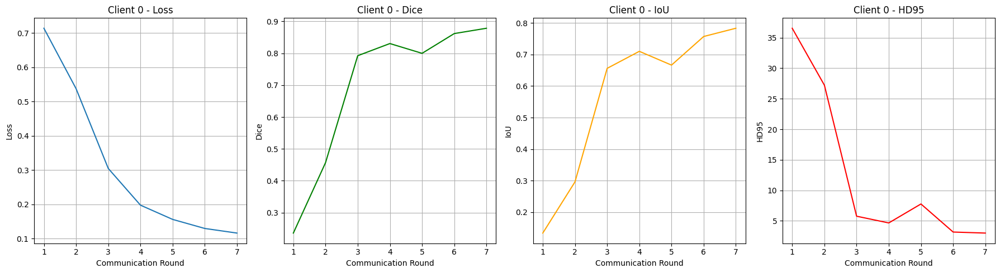

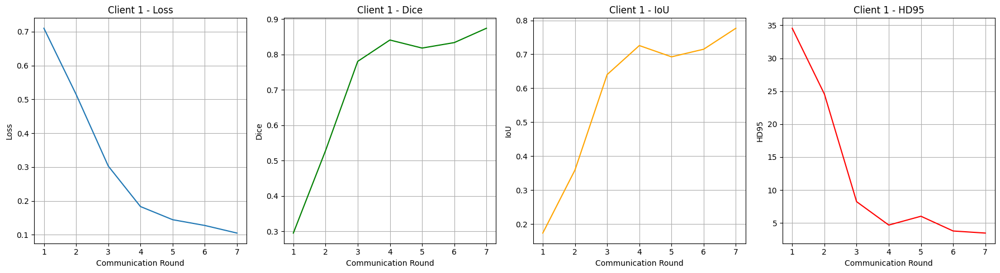

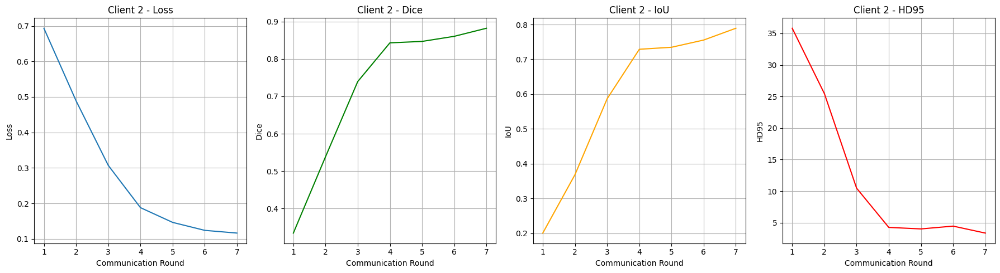

In [18]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

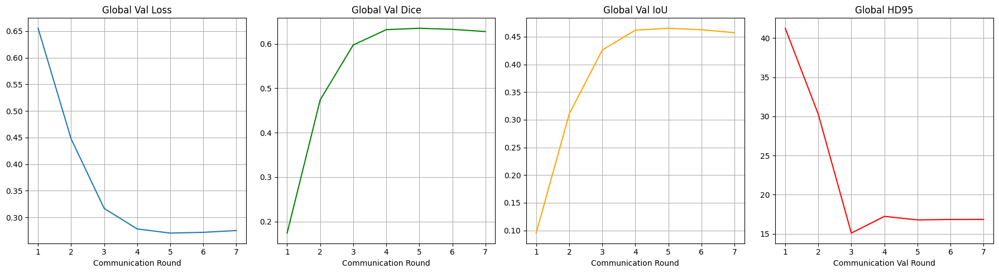

In [19]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [20]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_15520\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Li

Testing:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s, Dice=0.5295, IoU=0.3601, HD95=14.0946]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s, Dice=0.6264, IoU=0.4560, HD95=11.3586]


Test Set Metrics:
Dice: 0.6264
IoU: 0.4560
HD95: 11.3586


**Visualize**

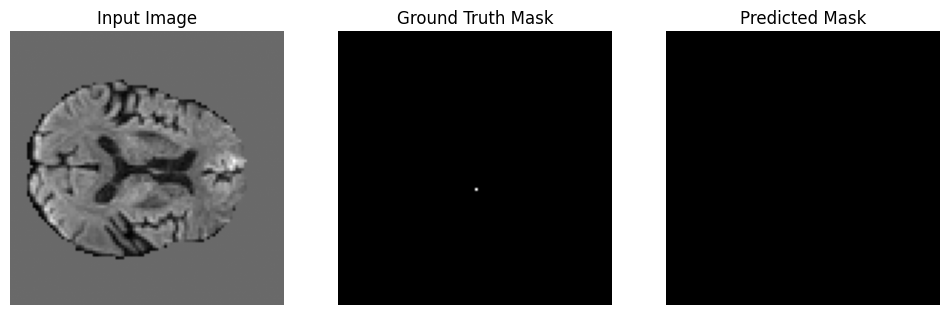

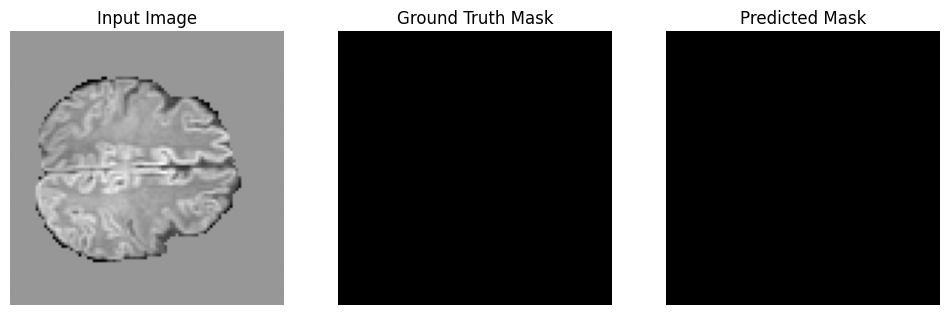

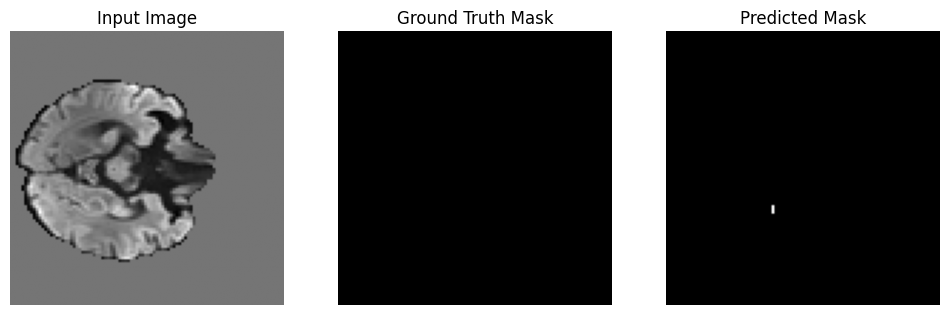

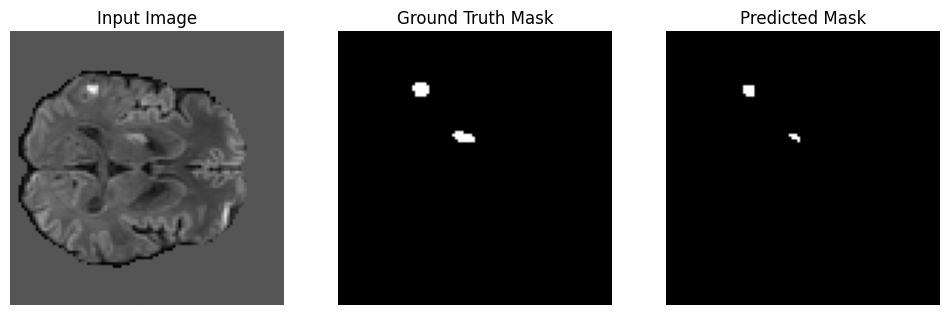

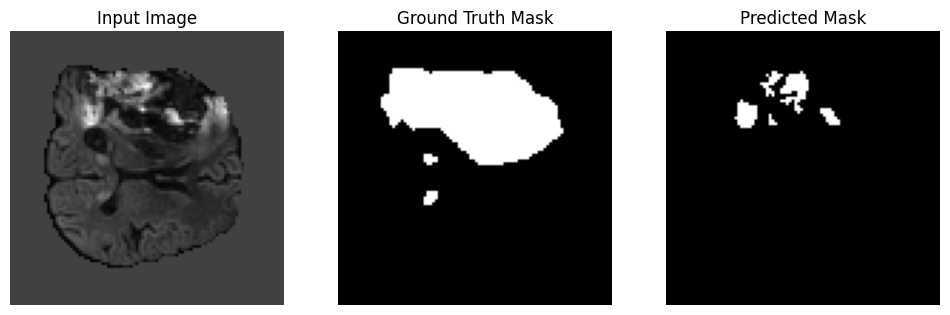

...

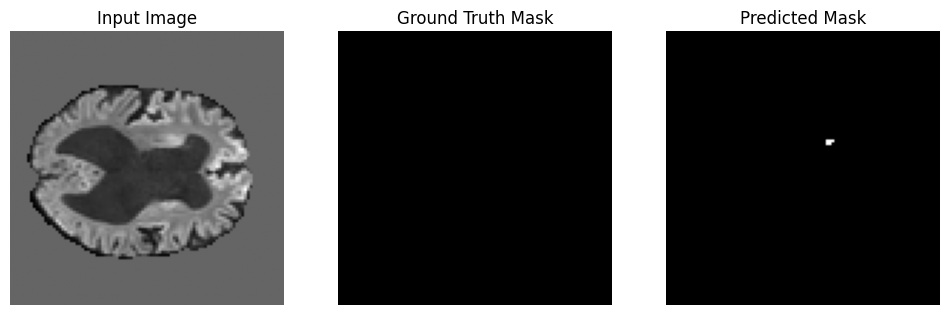

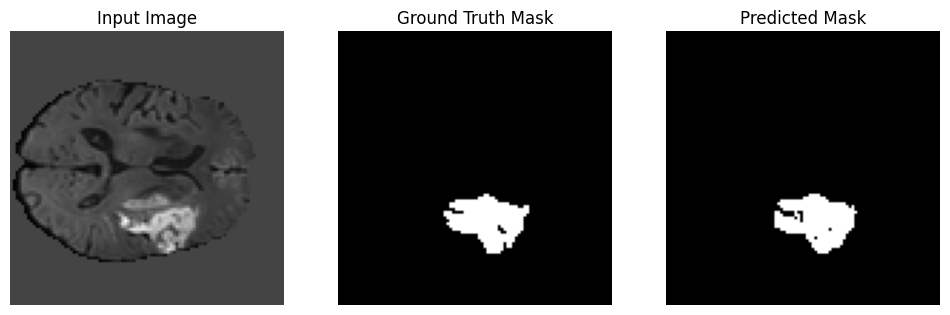

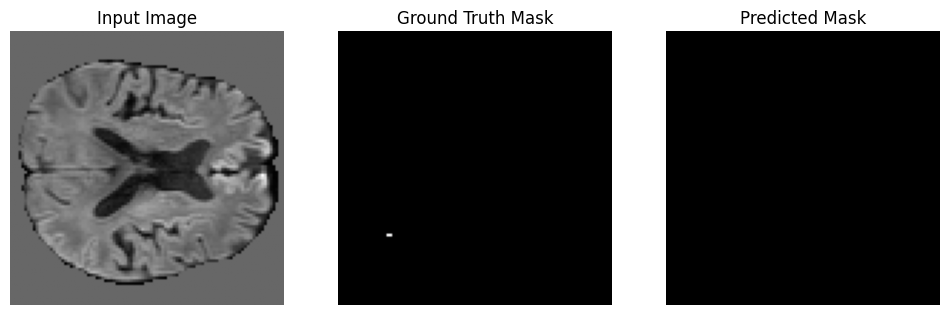

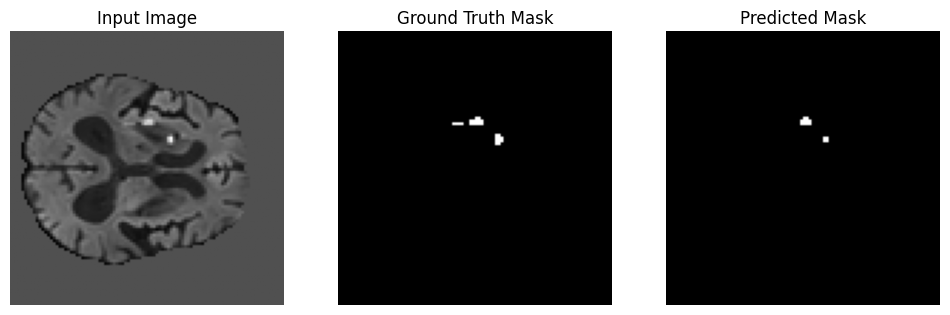

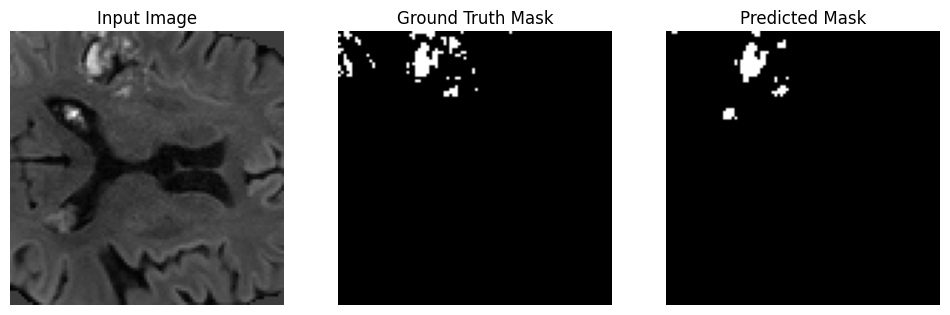

In [21]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()